In [0]:
pip install networkx

Note: you may need to restart the kernel using dbutils.library.restartPython() to use updated packages.
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 14.0 MB/s eta 0:00:00
Note: you may need to restart the kernel using dbutils.library.restartPython() to use updated packages.


In [0]:
from pyspark.sql.functions import to_date

csv_file_path = "/Volumes/studentproject_01_exploration/studentproject_01_schema/files/Job History 1.csv"

# Set the legacy time parser policy
spark.conf.set("spark.sql.legacy.timeParserPolicy", "LEGACY")

# Read the CSV file into a Spark DataFrame
df_spark = spark.read.option("header", "true").csv(csv_file_path)

# Convert "Reporting Date" to date type
df_spark = df_spark.withColumn("Reporting Date", to_date(df_spark["Reporting Date"], "dd-MMM-yy"))

# Filter the DataFrame to only include rows where the "Employee Status" is "Active" and "Reporting Date" is "2024-04-01"
filtered_df_spark = df_spark.filter(
    (df_spark["Employee Status"] == "Active") & 
    (df_spark["Reporting Date"] == "2024-04-01")
)

# # Display the Spark DataFrame
# display(filtered_df_spark)

In [0]:
row_count = filtered_df_spark.count()
row_count

5955

In [0]:
csv_file_path = "/Volumes/studentproject_01_exploration/studentproject_01_schema/files/Job History Manager Change.csv"

# Read the CSV file into a Spark DataFrame
df_manager_spark = spark.read.option("header", "true").csv(csv_file_path)

# # Display the Spark DataFrame
# display(df_manager_spark)

In [0]:
df_manager_spark.dtypes

[('Event Date', 'string'),
 ('Event Month', 'string'),
 ('Person ID', 'string'),
 ('Gender', 'string'),
 ('Employee Status (Picklist Label)', 'string'),
 ('Employee Class (Picklist Label)', 'string'),
 ('Employment Type (Picklist Label)', 'string'),
 ('Division', 'string'),
 ('Subdivision (Label)', 'string'),
 ('Department Name', 'string'),
 ('JH Job Family (Label)', 'string'),
 ('JH Position Title (Label)', 'string'),
 ('External Title', 'string'),
 ('Supervisor ID', 'string'),
 ('Diversity Question', 'string')]

In [0]:
from pyspark.sql.functions import to_date, col
from pyspark.sql.types import IntegerType

# Convert "Event Date" and "Event Month" to date type
df_manager_spark = df_manager_spark.withColumn("Event Date", to_date(col("Event Date"), "dd/MM/yyyy"))
df_manager_spark = df_manager_spark.withColumn("Event Month", to_date(col("Event Month"), "MM/yyyy"))

# Convert 'Person ID' and 'Supervisor ID' to integer
#df_manager_spark = df_manager_spark.withColumn("Person ID", col("Person ID").cast(IntegerType()))
#df_manager_spark = df_manager_spark.withColumn("Supervisor ID", col("Supervisor ID").cast(IntegerType()))

display(df_manager_spark.dtypes)

_1,_2
Event Date,date
Event Month,date
Person ID,string
Gender,string
Employee Status (Picklist Label),string
Employee Class (Picklist Label),string
Employment Type (Picklist Label),string
Division,string
Subdivision (Label),string
Department Name,string


In [0]:
from pyspark.sql import Window
from pyspark.sql.functions import row_number, desc, col

# Convert "Event Date" to date type
df_manager_spark = df_manager_spark.withColumn("Event Date", to_date(df_manager_spark["Event Date"], "dd/MM/yyyy"))

# Check for missing or incorrect 'Event Date' values
filtered_df_manager_spark = df_manager_spark.filter(col("Event Date").isNotNull())

# Define a window partitioned by 'Person ID', ordered by 'Event Date' in descending order
window = Window.partitionBy('Person ID').orderBy(desc('Event Date'))

# Add a row number to each row in the window
filtered_df_manager_spark = filtered_df_manager_spark.withColumn('row_number', row_number().over(window))

# Keep only the first row (i.e., the most recent record) for each 'Person ID'
filtered_df_manager_spark = filtered_df_manager_spark.filter(filtered_df_manager_spark['row_number'] == 1)

# Drop the 'row_number' column
filtered_df_manager_spark = filtered_df_manager_spark.drop('row_number')

# Filter out rows where 'Supervisor ID' is 'NO_MANAGER'
filtered_df_manager_spark = filtered_df_manager_spark.filter(filtered_df_manager_spark['Supervisor ID'] != 'NO_MANAGER')

# # Display the Spark DataFrame
# display(filtered_df_manager_spark)

#### Make sure all Person IDs and Supervisor IDs exist

In [0]:
# Make sure all Person IDs and Supervisor IDs exist
from pyspark.sql.functions import col

all_person_ids = filtered_df_spark.select('Person ID').distinct().collect()

# Convert all_person_ids to a DataFrame
all_person_ids_df = spark.createDataFrame(all_person_ids)

# Rename the column to 'Person ID'
all_person_ids_df = all_person_ids_df.withColumnRenamed('_1', 'Person ID')

# Join filtered_df_manager_spark with all_person_ids_df on 'Person ID'
filtered_df_manager_spark = filtered_df_manager_spark.join(all_person_ids_df, on='Person ID', how='inner')

# Rename the column in all_person_ids_df to 'Supervisor ID'
all_person_ids_df = all_person_ids_df.withColumnRenamed('Person ID', 'Supervisor ID')

# Join filtered_df_manager_spark with all_person_ids_df on 'Supervisor ID'
filtered_df_manager_spark = filtered_df_manager_spark.join(all_person_ids_df, on='Supervisor ID', how='inner')

# display(filtered_df_manager_spark)

In [0]:
# Join filtered_df_spark with filtered_df_manager_spark on 'Person ID'
result_df = filtered_df_spark.join(filtered_df_manager_spark.select('Person ID', 'Supervisor ID'), on='Person ID', how='left')
display(result_df)
# result_df.count()

Person ID,Reporting Date,Employee Status,Employee Class,Employment Type,Company (externalCode),Company (Label),Division (Code),Division,Subdivision (Code),Subdivision (Label),Department (Code),Department,JH Job Family (externalCode),JH Job Family,JH Position Title (externalCode),JH Position Title,External Title,Original Start Date,Hire Date,Last Day of Service,Sub Termination Reason (externalCode),Sub Termination Reason (Label),Location Group (Name),RCM City,RCM State (externalName),RCM Country (Picklist Label),Gender,Age (Group),Proj / OH,Placements,BU,Tenure (Group - Hire Date),Manager/No Manager,Critical / Core,Generation,Diversity Question,Job Level,Department (PM),Supervisor ID
10076,2024-04-01,Active,Staff,Full-Time Employee,100,John Holland Group,INFR,Infrastructure,INFRPRV,Infrastructure Projects VIC/SA/TAS,8550,Melbourne Water Capital Delivery Program,TAL-CONSTR,Trades and Labour - Construction Trades,TAL-CONSTR-SUP,Supervisor,Supervisor,6/07/2009,6/07/2009,null,null,null,Victoria,Melbourne,Victoria,Australia,M,40-50 yrs,Project,null,Infrastructure,10-15 yrs,Non Manager,Critical,Gen X,6,5,No Move,93852
10079,2024-04-01,Active,Staff,Full-Time Employee,100,John Holland Group,MAP,Major Projects,MAPPRS,Major Projects,7020,Rozelle Interchange (Westconnex 3B),TAL-CONSTR,Trades and Labour - Construction Trades,TAL-CONSTR-GSUP,General Superintendent,General Superintendent,2/05/2005,6/06/2012,null,null,null,New South Wales,Rozelle,New South Wales,Australia,M,50 and more,Project,null,Major Projects,10-15 yrs,Manager,Critical,Gen X,6,7,No Move,16053
10357,2024-04-01,Active,Staff,Full-Time Employee,100,John Holland Group,RAL,Rail & Transport,RALSE,Rail Infrastructure Services,RSNTRK,RIS NSW - Track & Civil,TAL-TRACK,Trades and Labour - Trackworker Trades,TAL-TRACK-TRACKSUP,Track Supervisor,Supervisor,27/07/2009,4/10/2021,null,TR,Transfer to other JH Entity,New South Wales,Sydney,New South Wales,Australia,M,30-40 yrs,Project,null,Rail,2-5 yrs,Non Manager,Critical,Millenial,6,5,No Move,11843
10390,2024-04-01,Active,Staff,Full-Time Employee,100,John Holland Group,RAL,Rail & Transport,RALPR,Rail Projects,7644,Metro Tunnel Rail Network Alliance,PCON-PLAN,Project Controls - Planning,PCON-PLAN-SPLAN,Senior Planner,Senior Planner,30/01/2017,30/01/2017,null,null,null,Victoria,Melbourne,Victoria,Australia,M,50 and more,Project,null,Rail,5-10 yrs,Non Manager,Critical,Baby Bommer,6,5,No Move,60209
10460,2024-04-01,Active,Staff,Full-Time Employee,100,John Holland Group,INFR,Infrastructure,INFROH,Infrastructure Overheads,INFRPRE,Infrastructure Pre-Contracts,PRECON-EST,Pre-Contracts - Estimating and Cost Planning,PRECON-EST-SEE,Senior Estimator/ Cost Planner,Senior Estimator,17/08/2009,17/08/2009,null,null,null,New South Wales,Sydney,New South Wales,Australia,M,30-40 yrs,Overhead,null,Infrastructure,10-15 yrs,Non Manager,Critical,Millenial,6,6,No Move,83634
10791,2024-04-01,Active,Staff,Full-Time Employee,100,John Holland Group,RAL,Rail & Transport,RALOH,Rail Overheads,RALPE,Rail People,PEOP-HROP,People - HR Operations,PEO-HROP-GEMP,General Manager People,"General Manager People, Rail",24/01/2017,24/01/2017,null,null,null,Victoria,Melbourne,Victoria,Australia,M,40-50 yrs,Overhead,null,Rail,5-10 yrs,Manager,Non critical,Millenial,6,7,No Move,null
110077,2024-04-01,Active,Staff,Full-Time Employee,100,John Holland Group,ICT,Information Communication Technology,IT,Information Technology,ITAET,Applications & Emerging Technology,IT-APPM,IT - Application Management,IT-APPM-PDAD,Program Director - Applications Delivery,Group Manager Business Technology and Planning,7/11/2018,7/11/2018,null,null,null,Victoria,Melbourne,Victoria,Australia,M,30-40 yrs,Overhead,null,ICT,5-10 yrs,Non Manager,Non critical,Millenial,6,7,No Move,120604
110172,2024-04-01,Active,Workforce,Full-Time Employee,400,John Holland P/L,RAL,Rail & Transport,RALSE,Rail Infrastructure Services,RSVTRK,RIS VIC - Track & Civil,WORK,Workforce,WORK-150,Workforce - Rail Track Worker,RW4 - resurf

In [0]:
from pyspark.sql.functions import col

# Filter out rows where 'Employee Class' is 'Workforce'
result_df = result_df.filter(col('Employee Class') != 'Workforce')

display(result_df)

Person ID,Reporting Date,Employee Status,Employee Class,Employment Type,Company (externalCode),Company (Label),Division (Code),Division,Subdivision (Code),Subdivision (Label),Department (Code),Department,JH Job Family (externalCode),JH Job Family,JH Position Title (externalCode),JH Position Title,External Title,Original Start Date,Hire Date,Last Day of Service,Sub Termination Reason (externalCode),Sub Termination Reason (Label),Location Group (Name),RCM City,RCM State (externalName),RCM Country (Picklist Label),Gender,Age (Group),Proj / OH,Placements,BU,Tenure (Group - Hire Date),Manager/No Manager,Critical / Core,Generation,Diversity Question,Job Level,Department (PM),Supervisor ID
10066,2024-04-01,Active,Staff,Full-Time Employee,100,John Holland Group,ICT,Information Communication Technology,IT,Information Technology,ITAET,Applications & Emerging Technology,IT-PROJ,IT - Project Management,IT-PROJ-ITPM,IT Project Manager,Project IT Systems Manager,6/07/2009,17/05/2010,null,null,null,New South Wales,Sydney,New South Wales,Australia,M,40-50 yrs,Overhead,null,ICT,10-15 yrs,Manager,Non critical,Gen X,7,5,No Move,120604
10074,2024-04-01,Active,Staff,Full-Time Employee,100,John Holland Group,RAL,Rail & Transport,RALPR,Rail Projects,7670,Sunshine Systems Alliance,TAL-CONSTR,Trades and Labour - Construction Trades,TAL-CONSTR-GSUP,General Superintendent,Superintendent,30/03/2015,30/03/2015,19/04/2024,RT,Resigned - Retirement,Victoria,Melbourne,Victoria,Australia,M,50 and more,Project,null,Rail,5-10 yrs,Non Manager,Critical,Baby Bommer,6,7,No Move,95354
10076,2024-04-01,Active,Staff,Full-Time Employee,100,John Holland Group,INFR,Infrastructure,INFRPRV,Infrastructure Projects VIC/SA/TAS,8550,Melbourne Water Capital Delivery Program,TAL-CONSTR,Trades and Labour - Construction Trades,TAL-CONSTR-SUP,Supervisor,Supervisor,6/07/2009,6/07/2009,null,null,null,Victoria,Melbourne,Victoria,Australia,M,40-50 yrs,Project,null,Infrastructure,10-15 yrs,Non Manager,Critical,Gen X,6,5,No Move,93852
10079,2024-04-01,Active,Staff,Full-Time Employee,100,John Holland Group,MAP,Major Projects,MAPPRS,Major Projects,7020,Rozelle Interchange (Westconnex 3B),TAL-CONSTR,Trades and Labour - Construction Trades,TAL-CONSTR-GSUP,General Superintendent,General Superintendent,2/05/2005,6/06/2012,null,null,null,New South Wales,Rozelle,New South Wales,Australia,M,50 and more,Project,null,Major Projects,10-15 yrs,Manager,Critical,Gen X,6,7,No Move,16053
10087,2024-04-01,Active,Staff,Full-Time Employee,100,John Holland Group,RAL,Rail & Transport,RALPR,Rail Projects,7644,Metro Tunnel Rail Network Alliance,PDEL-RAIL,Project Delivery - Rail,PDEL-RAIL-SEPM,Senior Project Manager,Senior Project Manager,30/05/2022,30/05/2022,null,null,null,Victoria,Melbourne,Victoria,Australia,M,30-40 yrs,Project,null,Rail,1-2 yrs,Non Manager,Critical,Millenial,6,7,No Move,23378
10284,2024-04-01,Active,Staff,Full-Time Employee,100,John Holland Group,RAL,Rail & Transport,RALPR,Rail Projects,7625,More Trains More Services (MTMS),PDEL-RAIL,Project Delivery - Rail,PDEL-RAIL-RSUPOHW,Superintendent - OHW,Superintendent - OHW,27/07/2009,28/02/2011,null,null,null,New South Wales,Erskinville,New South Wales,Australia,M,50 and more,Project,null,Rail,10-15 yrs,Non Manager,Non critical,Gen X,6,6,No Move,37794
10289,2024-04-01,Active,Staff,Full-Time Employee,100,John Holland Group,MAP,Major Projects,MAPPRS,Major Projects,7110,West Gate Tunnel Project,TAL-CONSTR,Trades and Labour - Construction Trades,TAL-CONSTR-GSUP,General Superintendent,General Superintendent,3/08/2009,3/08/2009,null,null,null,Victoria,Melbourne,Victoria,Australia,M,40-50 yrs,Project,null,Major Projects,10-15 yrs,Manager,Critical,Gen X,6,7,No Move,62329
10357,2024-04-01,Active,Staff,Full-Time Employee,100,John Holland Group,RAL,Rail & Transport,RALSE,Rail Infrastructure Services,RSNTRK,RIS NSW - Track & Civil,TAL-TRACK,Trades and Labour - Trackworker Trades,TAL-TRACK-TRACKSUP,Track Supervisor,Supervisor,27/07/2009,4/10/2021,null,TR,Transf

In [0]:
print(result_df.columns)

['Person ID', 'Reporting Date', 'Employee Status', 'Employee Class', 'Employment Type', 'Company (externalCode)', 'Company (Label)', 'Division (Code)', 'Division', 'Subdivision (Code)', 'Subdivision (Label)', 'Department (Code)', 'Department', 'JH Job Family (externalCode)', 'JH Job Family', 'JH Position Title (externalCode)', 'JH Position Title', 'External Title', 'Original Start Date', 'Hire Date', 'Last Day of Service', 'Sub Termination Reason (externalCode)', 'Sub Termination Reason (Label)', 'Location Group (Name)', 'RCM City', 'RCM State (externalName)', 'RCM Country (Picklist Label)', 'Gender', 'Age (Group)', 'Proj / OH', 'Placements', 'BU', 'Tenure (Group - Hire Date)', 'Manager/No Manager', 'Critical / Core', 'Generation', 'Diversity Question', 'Job Level', 'Department (PM)', 'Supervisor ID']


In [0]:
# Display the number of rows in result_df
display(result_df.count())


4419

# Construct the Graph

In [0]:
# !pip install networkx

In [0]:
import networkx as nx
import matplotlib.pyplot as plt

# Create an empty graph
G = nx.Graph()

# Create an empty graph 
G.clear()

# Convert PySpark DataFrame to Pandas DataFrame
pd_result_df = result_df.toPandas()

# Define the values to be replaced
values_to_replace = ['Customer & Corp Affairs', 'Chief Operations Office', 'Commercial', 'Executive Management', 'Finance & Group Services', 'HSE', 'ICT', 'People', 'Strategy', 'WA Region']

# Replace the values in the 'BU' column of the copied DataFrame
pd_result_df['BU'] = pd_result_df['BU'].replace(values_to_replace, 'Corporate')

# Define a color map
COLOR_MAP = {
    'Major Projects': 'salmon',
    'Infrastructure': 'slateblue',
    'Rail': 'lightgreen',
    'Building': 'khaki',
    'Corporate': 'chocolate',
    'TEK': 'lightblue'
}

# # Get the count of each unique value in the 'BU' column of the copied DataFrame
# value_counts = pd_result_df['BU'].value_counts()

# # Print the count of each unique value
# print(value_counts)

# Iterate over the rows of the Pandas DataFrame
for index, row in pd_result_df.iterrows():
    # Add the row as a node to the graph
    G.add_node(index, attr_dict=row.to_dict())

# Print the number of nodes in the graph
print(f"Number of nodes: {G.number_of_nodes()}")

Number of nodes: 4419


In [0]:
# # Get the count of each unique value in the 'BU' column
value_counts = pd_result_df['BU'].value_counts()

# # Print the count of each unique value
print(value_counts)

Infrastructure    1321
Major Projects    1082
Rail               905
Building           592
Corporate          425
TEK                 94
Name: BU, dtype: int64


In [0]:
# Define a color map
color_map = {
    'Major Projects': 'salmon',
    'Infrastructure': 'slateblue',
    'Rail': 'lightgreen',
    'Building': 'khaki',
    'Corporate': 'chocolate',
    'TEK': 'lightblue'
}

# Get the colors of the nodes
node_colors = [color_map.get(G.nodes[node].get('attr_dict').get('BU', 'NULL'), 'lightpink') for node in G.nodes]

# Get the labels of the nodes
node_labels = {node: G.nodes[node].get('attr_dict').get('Person ID', 'N/A') for node in G.nodes}

# Get the spring layout positions
pos = nx.random_layout(G)

# Draw the graph
nx.draw(G, pos, with_labels=True, node_color=node_colors, labels=node_labels, font_size=5, node_size=10)

# Show the plot
plt.show()

In [0]:
# Get the colors of the nodes
color_map = COLOR_MAP
node_colors = [color_map.get(G.nodes[node].get('attr_dict').get('BU', 'NULL'), 'lightpink') for node in G.nodes]

# Get the spring layout positions
pos = nx.random_layout(G)

# Draw the graph
nx.draw(G, pos, with_labels=False, node_color=node_colors, node_size=5)

# Show the plot
plt.show()

### Undirected Graph

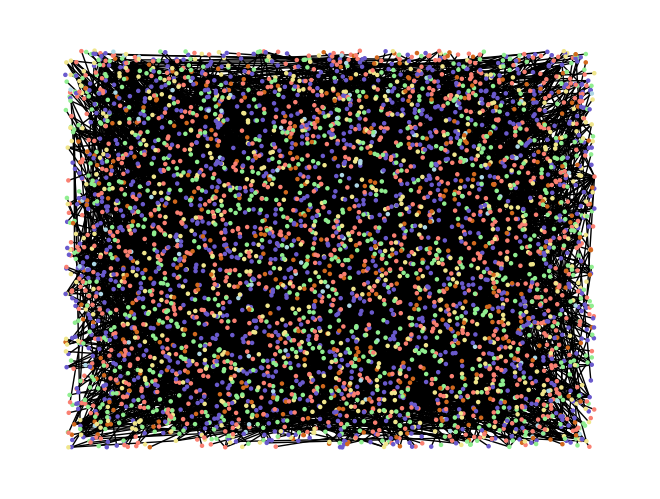

In [0]:
# Add edges from 'Person ID' to 'Supervisor ID' with 'is_manager' attribute
for node in G.nodes:
    supervisor_id = G.nodes[node].get('attr_dict').get('Supervisor ID')
    
    # Check if 'Supervisor ID' equals to another node's 'Person ID'
    for other_node in G.nodes:
        person_id = G.nodes[other_node].get('attr_dict').get('Person ID')
        
        if supervisor_id == person_id:
            G.add_edge(node, other_node, is_manager=True)

# Get the colors of the nodes
color_map = COLOR_MAP
node_colors = [color_map.get(G.nodes[node].get('attr_dict').get('BU', 'NULL'), 'lightpink') for node in G.nodes]

labels = {node: G.nodes[node].get('attr_dict').get('Person ID', 'N/A') for node in G.nodes}

# Draw the new graph with labels
nx.draw(G, pos, node_color=node_colors, with_labels=False, node_size=5)

In [0]:
# Find the node with 'Person ID' = 12355
node_12355 = None
for node in G.nodes:
    if G.nodes[node].get('attr_dict').get('Person ID') == '12355':
        node_12355 = node
        break

# If the node is found, get its edges
if node_12355 is not None:
    node_12355 = G.edges(node_12355, data=True)

    # Print the edges
    for edge in node_12355:
        print(edge)
else:   
    print("Node with 'Person ID' = 12355 does not exist in the graph.")


(1796, 1303, {'is_manager': True})
(1796, 3011, {'is_manager': True})
(1796, 2056, {'is_manager': True})
(1796, 3464, {'is_manager': True})
(1796, 3940, {'is_manager': True})


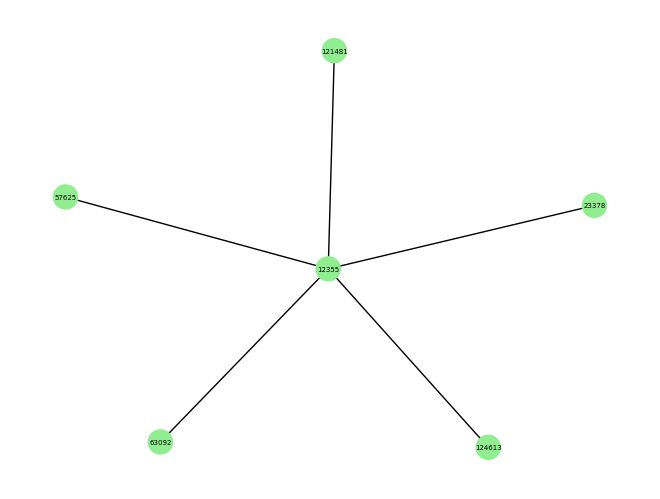

In [0]:
# Example (the node with 'Person ID' = 12355)
from collections import deque

# Create a new graph
G_1199 = nx.Graph()

# Use a queue to implement BFS
# Got 1199 from the previous cell
queue = deque([1796])

while queue:
    node = queue.popleft()
    G_1199.add_node(node)
    neighbors = list(G.neighbors(node))
    G_1199.add_nodes_from(neighbors)
    
    for neighbor in neighbors:
        if G.has_edge(node, neighbor):
            G_1199.add_edge(node, neighbor)
            
        if neighbor not in G_1199:
            queue.append(neighbor)

# Create a dictionary of labels
labels = {node: G.nodes[node].get('attr_dict').get('Person ID') for node in G_1199.nodes}

# Get the colors of the nodes
node_colors = [color_map.get(G.nodes[node].get('attr_dict').get('BU', 'NULL'), 'lightpink') for node in G_1199.nodes]

# Draw the new graph with labels
nx.draw(G_1199, labels=labels, node_color=node_colors, with_labels=True, font_size=5)
plt.show()

## Directed Graph

Number of nodes: 4419


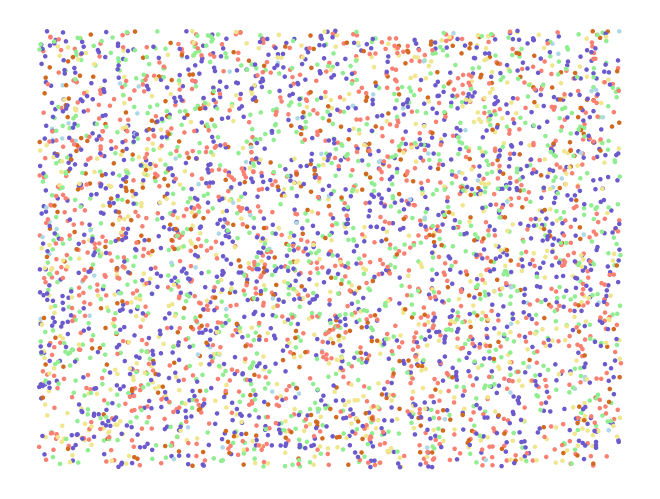

In [0]:
# Create an empty graph
Gr = nx.DiGraph()
Gr.clear()

# Iterate over the rows of the DataFrame
for index, row in pd_result_df.iterrows():
    # Add the row as a node to the graph
    Gr.add_node(index, attr_dict=row.to_dict())

# Print the number of nodes in the graph
print(f"Number of nodes: {Gr.number_of_nodes()}")

# Get the colors of the nodes
color_map = COLOR_MAP
node_colors = [color_map.get(Gr.nodes[node].get('attr_dict').get('BU', 'NULL'), 'pink') for node in Gr.nodes]

# Get the spring layout positions
pos = nx.random_layout(Gr)

# Draw the subgraph
nx.draw(Gr, pos, with_labels=False, node_color=node_colors, node_size=5)

# Show the plot
plt.show()

In [0]:
# Add edges from 'Person ID' to 'Supervisor ID' with 'manager' attribute
for node in Gr.nodes:
    supervisor_id = Gr.nodes[node].get('attr_dict').get('Supervisor ID')
    
    # Check if 'Supervisor ID' equals to another node's 'Person ID'
    for other_node in Gr.nodes:
        person_id = Gr.nodes[other_node].get('attr_dict').get('Person ID')
        
        if supervisor_id == person_id:
            Gr.add_edge(node, other_node, manager=True)

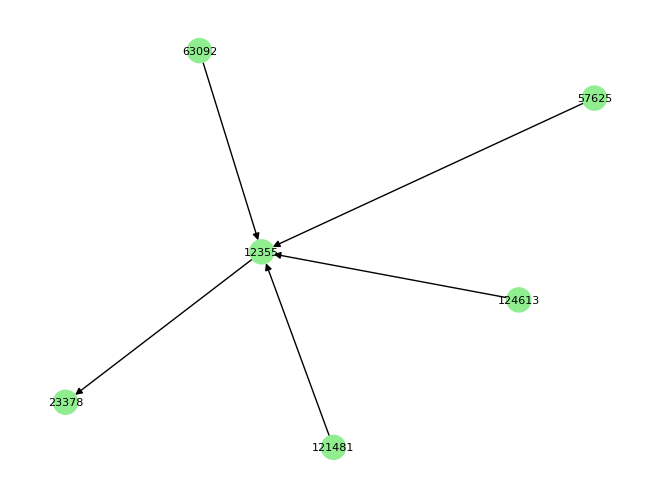

In [0]:
# Define the specific nodes
# Got these number from cell 17
specific_nodes = [1796, 1303, 3011, 2056, 3464, 3940]

# Create a subgraph containing only the specific nodes
subgraph = Gr.subgraph(specific_nodes).copy()

# Get the colors of the nodes in the subgraph
color_map = COLOR_MAP
node_colors = [color_map.get(subgraph.nodes[node].get('attr_dict').get('BU', 'NULL'), 'pink') for node in subgraph.nodes]

# Create a dictionary of labels for the subgraph
labels = {node: subgraph.nodes[node].get('attr_dict').get('Person ID') for node in subgraph.nodes}

# Draw the subgraph with labels and edges
pos = nx.spring_layout(subgraph)  # You can choose different layouts like spring_layout or shell_layout
nx.draw(subgraph, pos, labels=labels, node_color=node_colors, with_labels=True, font_size=8, edge_color='black')
plt.show()

In [0]:
# # Get the colors of the nodes in the Gr graph
# color_map = COLOR_MAP
# node_colors = [color_map.get(Gr.nodes[node].get('attr_dict').get('BU', 'NULL'), 'pink') for node in Gr.nodes]

# # Create a dictionary of labels for the subgraph
# labels = {node: Gr.nodes[node].get('attr_dict').get('Person ID') for node in Gr.nodes}

# # Draw the subgraph with labels
# nx.draw(Gr, labels=labels, node_color=node_colors, with_labels=True, font_size=5)
# plt.show()

In [0]:
# print(Gr.nodes[1199].get('attr_dict').get('Department'))

In [0]:
# Find nodes in the specific department
nodes_in_department = [
    node for node, attr in Gr.nodes(data=True) 
    if attr.get('attr_dict').get('Department') == 'Metro Tunnel Rail Network Alliance'
]

print(f"There are {len(nodes_in_department)} nodes in the 'Metro Tunnel Rail Network Alliance' department.")

# Create a subgraph of G that contains only the nodes in the specific department
subgraph_1 = Gr.subgraph(nodes_in_department)

# Get the colors of the nodes in the subgraph
color_map = COLOR_MAP
node_colors = [
    color_map.get(Gr.nodes[node].get('BU', 'NULL'), 'pink') 
    for node in subgraph_1.nodes
]

# Create a dictionary of labels for the subgraph
labels = {
    node: Gr.nodes[node].get('Person ID') 
    for node in subgraph_1.nodes
}

# Display the subgraph
nx.draw(subgraph_1, labels=labels, node_color=node_colors, with_labels=True, font_size=5)

# SNA

##Degree of Centrality

In [0]:
from pyspark.sql import Row

# Calculate degree centrality for all nodes in the graph Gr
all_degree_centrality = nx.degree_centrality(Gr)

# Create a list of tuples of (node, Person ID, degree centrality)
data = [(int(node), Gr.nodes[node].get('attr_dict').get('Person ID'), centrality) for node, centrality in all_degree_centrality.items()]

# Create a Spark DataFrame from the list of tuples
degree_centrality_df = spark.createDataFrame(data, ['node', 'Person ID', 'degree_centrality'])

# Display the DataFrame
display(degree_centrality_df)

# Convert the degree centrality dictionary to a Spark DataFrame
degree_centrality_df = spark.createDataFrame([Row(node=int(node), degree_centrality=centrality) for node, centrality in all_degree_centrality.items()])

# Display the DataFrame
display(degree_centrality_df)

node,Person ID,degree_centrality
0,10066,6.79040289723857E-4
1,10074,2.2634676324128565E-4
2,10076,2.2634676324128565E-4
3,10079,0.002037120869171571
4,10087,2.2634676324128565E-4
5,10284,2.2634676324128565E-4
6,10289,0.002489814395654142
7,10357,2.2634676324128565E-4
8,10390,2.2634676324128565E-4
9,10411,2.2634676324128565E-4


node,degree_centrality
0,6.79040289723857E-4
1,2.2634676324128565E-4
2,2.2634676324128565E-4
3,0.002037120869171571
4,2.2634676324128565E-4
5,2.2634676324128565E-4
6,0.002489814395654142
7,2.2634676324128565E-4
8,2.2634676324128565E-4
9,2.2634676324128565E-4


In [0]:
# Convert node 2668 attributes to a Spark DataFrame with columns for each attribute
node_2668_attributes = [(key, value) for key, value in Gr.nodes[3890].items()]
node_2668_df = spark.createDataFrame(node_2668_attributes, ['Attribute', 'Value'])

# Display the attributes of node 2668
display(node_2668_df)

Attribute,Value
attr_dict,"Map(JH Job Family -> Project Delivery - Infrastructure, BU -> Major Projects, Generation -> Millenial, Department -> West Gate Tunnel Project, Placements -> null, Subdivision (Label) -> Major Projects, Department (Code) -> 7110, Last Day of Service -> null, Company (externalCode) -> 100, JH Position Title -> Construction Director >1.5b, Sub Termination Reason (externalCode) -> null, Hire Date -> 6/08/2018, Original Start Date -> 6/08/2018, Location Group (Name) -> Victoria, Division -> Major Projects, JH Job Family (externalCode) -> PDEL-INFR, Reporting Date -> 2024-04-01, Division (Code) -> MAP, Employee Status -> Active, Person ID -> 62329, Employment Type -> Full-Time Employee, External Title -> Civil & Surface Manager, Proj / OH -> Project, Tenure (Group - Hire Date) -> 5-10 yrs, Age (Group) -> 30-40 yrs, Department (PM) -> No Move, Supervisor ID -> 58947, Diversity Question -> 6, JH Position Title (externalCode) -> PDEL-INFR-CD1B, Manager/No Manager -> Manager, RCM State (externalName) -> Victoria, RCM Country (Picklist Label) -> Australia, Job Level -> 8, Critical / Core -> Critical, Employee Class -> Staff, Subdivision (Code) -> MAPPRS, Company (Label) -> John Holland Group, Gender -> M, Sub Termination Reason (Label) -> null, RCM City -> Melbourne)"


In [0]:
# Create a subgraph for all nodes pointing to node 2668 and its neighbors
pointing_nodes_3890 = list(Gr.predecessors(3890))
pointing_and_neighbors_nodes = pointing_nodes_3890  + list(Gr.neighbors(3890)) + [3890]
subgraph_pointing_and_neighbors = Gr.subgraph(pointing_and_neighbors_nodes)

# Generate positions for each node using NetworkX's layout algorithm
pos = nx.spring_layout(subgraph_pointing_and_neighbors)

# Prepare labels with 'Person ID' instead of node number
labels = {node: Gr.nodes[node].get('attr_dict').get('Person ID', node) for node in subgraph_pointing_and_neighbors.nodes()}

# Draw the subgraph with 'Person ID' as labels
plt.figure(figsize=(10, 8))
nx.draw(subgraph_pointing_and_neighbors, pos, labels=labels, with_labels=True, node_color='lightgreen', edge_color='gray')
plt.title('Subgraph showing all nodes pointing to node 3890 and its neighbors')

# Save the plot as an image and display it in Databricks
display("/tmp/subgraph_pointing_and_neighbors_2668.png")

In [0]:
# Find all nodes pointing to node 2668 in graph Gr and their Person IDs
pointing_nodes_2668_with_ids = [(node, Gr.nodes[node].get('attr_dict').get('Person ID')) for node in Gr.nodes() if 3890 in Gr.neighbors(node)]

# Convert the list of nodes and Person IDs to a Spark DataFrame
pointing_nodes_2668_with_ids_df = spark.createDataFrame(pointing_nodes_2668_with_ids, ['Node', 'Person ID'])

# Display the DataFrame
display(pointing_nodes_2668_with_ids_df)

Node,Person ID
6,10289
60,110824
61,110829
81,111150
123,111430
156,111640
185,112068
301,113360
343,113777
350,113835


## Eigen Vector Centrality

In [0]:
from pyspark.sql import Row

# Calculate eigenvector centrality for all nodes in the graph Gr
all_eigenvector_centrality = nx.eigenvector_centrality(Gr, max_iter=1000, tol=1e-06)

# Create a list of tuples of (node, Person ID, eigenvector centrality)
data = [(int(node), Gr.nodes[node].get('attr_dict').get('Person ID'), centrality) 
        for node, centrality in all_eigenvector_centrality.items()]

# Create a Spark DataFrame from the list of tuples
eigenvector_centrality_df = spark.createDataFrame(data, ['node', 'Person ID', 'eigenvector_centrality'])

# Display the DataFrame
display(eigenvector_centrality_df)

# Alternatively, convert the eigenvector centrality dictionary to a Spark DataFrame using Row
eigenvector_centrality_df_row = spark.createDataFrame(
    [Row(node=int(node), eigenvector_centrality=centrality) 
     for node, centrality in all_eigenvector_centrality.items()]
)

# Display the DataFrame created using Row
display(eigenvector_centrality_df_row)

node,Person ID,eigenvector_centrality
0,10066,5.715758148850008E-10
1,10074,2.189945650900387E-12
2,10076,2.189945650900387E-12
3,10079,2.2797334225872885E-9
4,10087,2.189945650900387E-12
5,10284,2.189945650900387E-12
6,10289,2.2320145068541862E-7
7,10357,2.189945650900387E-12
8,10390,2.189945650900387E-12
9,10411,2.189945650900387E-12


node,eigenvector_centrality
0,5.715758148850008E-10
1,2.189945650900387E-12
2,2.189945650900387E-12
3,2.2797334225872885E-9
4,2.189945650900387E-12
5,2.189945650900387E-12
6,2.2320145068541862E-7
7,2.189945650900387E-12
8,2.189945650900387E-12
9,2.189945650900387E-12


In [0]:
# Convert node 2668 attributes to a Spark DataFrame with columns for each attribute
node_2668_attributes = [(key, value) for key, value in Gr.nodes[3634].items()]
node_2668_df = spark.createDataFrame(node_2668_attributes, ['Attribute', 'Value'])

# Display the attributes of node 2668
display(node_2668_df)

Attribute,Value
attr_dict,"Map(JH Job Family -> Project Delivery - Infrastructure, BU -> Infrastructure, Generation -> Gen X, Department -> Infrastructure NSW/ACT, Placements -> null, Subdivision (Label) -> Infrastructure Overheads, Department (Code) -> INFRNSW, Last Day of Service -> null, Company (externalCode) -> 100, JH Position Title -> General Manager Operations, Sub Termination Reason (externalCode) -> null, Hire Date -> 8/01/2018, Original Start Date -> 8/01/2018, Location Group (Name) -> New South Wales, Division -> Infrastructure, JH Job Family (externalCode) -> PDEL-INFR, Reporting Date -> 2024-04-01, Division (Code) -> INFR, Employee Status -> Active, Person ID -> 59536, Employment Type -> Full-Time Employee, External Title -> General Manager Infrastructure NSW/ACT/QLD, Proj / OH -> Overhead, Tenure (Group - Hire Date) -> 5-10 yrs, Age (Group) -> 40-50 yrs, Department (PM) -> No Move, Supervisor ID -> null, Diversity Question -> 6, JH Position Title (externalCode) -> PDEL-INFR-GEMO, Manager/No Manager -> Manager, RCM State (externalName) -> New South Wales, RCM Country (Picklist Label) -> Australia, Job Level -> 8, Critical / Core -> Critical, Employee Class -> Staff, Subdivision (Code) -> INFROH, Company (Label) -> John Holland Group, Gender -> M, Sub Termination Reason (Label) -> null, RCM City -> Sydney)"


In [0]:
# Create a subgraph for all nodes pointing to node 2668 and its neighbors
pointing_nodes_3890 = list(Gr.predecessors(396))
pointing_and_neighbors_nodes = pointing_nodes_3890  + list(Gr.neighbors(396)) + [396]
subgraph_pointing_and_neighbors = Gr.subgraph(pointing_and_neighbors_nodes)

# Generate positions for each node using NetworkX's layout algorithm
pos = nx.spring_layout(subgraph_pointing_and_neighbors)

# Prepare labels with 'Person ID' instead of node number
labels = {node: Gr.nodes[node].get('attr_dict').get('Person ID', node) for node in subgraph_pointing_and_neighbors.nodes()}

# Draw the subgraph with 'Person ID' as labels
plt.figure(figsize=(10, 8))
nx.draw(subgraph_pointing_and_neighbors, pos, labels=labels, with_labels=True, node_color='lightgreen', edge_color='gray')
plt.title('Subgraph showing all nodes pointing to node 3890 and its neighbors')

# Save the plot as an image and display it in Databricks
display("/tmp/subgraph_pointing_and_neighbors_2668.png")

## Betweenness Centrality

In [0]:
from pyspark.sql import functions as F

def get_employee_count(df, supervisor_id):
    # Filter out rows where 'Supervisor ID' is None
    filtered_df = df.filter(F.col('Supervisor ID').isNotNull())

    # Perform the groupBy and count operations
    result = filtered_df.groupBy('Supervisor ID').count()

    # Get the count for the given supervisor_id
    count = result.filter(F.col('Supervisor ID') == supervisor_id).collect()[0]['count']

    return count

# # Calculate betweenness centrality
# betweenness_centrality = nx.betweenness_centrality(Gr, normalized=True, endpoints=False)

# # Initialize max centrality and corresponding person id
# max_centrality = 0
# max_person_id = None

# # Find the person id with the highest betweenness centrality
# for node, centrality in betweenness_centrality.items():
#     # Get 'Person ID' for the node
#     person_id = Gr.nodes[node].get('attr_dict').get('Person ID')
#     # Update max centrality and person id if current centrality is higher
#     if centrality > max_centrality:
#         max_centrality = centrality
#         max_person_id = person_id

# print(f"[Person ID = {max_person_id}]: Maximum Betweenness Centrality is {max_centrality}")

# Calculate betweenness centrality
betweenness_centrality = nx.betweenness_centrality(Gr, normalized=True, endpoints=False)

# Create a list of (Person ID, centrality) tuples
centrality_list = [(Gr.nodes[node].get('attr_dict').get('Person ID'), centrality) for node, centrality in betweenness_centrality.items()]

# Sort the list by centrality in descending order
centrality_list.sort(key=lambda x: x[1], reverse=True)

# Get the top 10
top_10 = centrality_list[:10]

# Print the results
for person_id, centrality in top_10:
    # Get the employee count for the person id
    employee_count = get_employee_count(result_df, person_id)
    print(f"[Person ID = {person_id}]: Betweenness Centrality is {centrality}, Employee Count is {employee_count}")

In [0]:
# # from pyspark.sql import functions as F

# # # Filter out rows where 'Supervisor_ID' is None
# # filtered_df = result_df.filter(F.col('Supervisor ID').isNotNull())

# # # Perform the groupBy, count and orderBy operations
# # result = filtered_df.groupBy('Supervisor ID').count().orderBy(F.desc('count')).first()

# # print(f"The 'Supervisor ID' that appears the most is {result['Supervisor ID']} with {result['count']} occurrences.")

In [0]:
# # Initialize the target person id
# target_person_id = "88947"
# target_centrality = None

# # Find the node with the specified 'Person ID' and get its betweenness centrality
# for node, centrality in betweenness_centrality.items():
#     # Get 'Person ID' for the node
#     person_id = Gr.nodes[node].get('attr_dict').get('Person ID')
#     if person_id == target_person_id:
#         target_centrality = centrality
#         break

# if target_centrality is not None:
#     print(f"[Person ID = {target_person_id}]: Betweenness Centrality is {target_centrality}")
# else:
#     print(f"Person ID {target_person_id} not found in the graph.")

## Degree Centrality

In [0]:
import networkx as nx
import pandas as pd


# Print the number of nodes in the graph
print(f"Number of nodes: {G.number_of_nodes()}")

# Calculate degree centrality
degree_centrality = nx.degree_centrality(G)

# Convert degree centrality results to a Pandas DataFrame and sort
degree_centrality_df = pd.DataFrame(degree_centrality.items(), columns=['Node', 'Degree Centrality'])
degree_centrality_df = degree_centrality_df.sort_values(by='Degree Centrality', ascending=False)

# Get the top 10 nodes by degree centrality
top_10_degree_centrality = degree_centrality_df.head(10)

# Print the top 10 nodes by degree centrality
print("Top 10 nodes by Degree Centrality:")
for index, row in top_10_degree_centrality.iterrows():
    node = row['Node']
    person_id = G.nodes[node].get('attr_dict').get('Person ID')
    centrality = row['Degree Centrality']
    print(f"[Person ID = {person_id}]: Degree Centrality is {centrality}")

# If needed, save the results back to a Spark DataFrame
top_10_spark_df = spark.createDataFrame(top_10_degree_centrality)
top_10_spark_df.show()



Number of nodes: 4419
Top 10 nodes by Degree Centrality and their number of edges:
[Person ID = 62329]: Degree Centrality is 0.009053870529651425, Number of edges = 40
[Person ID = 23624]: Degree Centrality is 0.007922136713444997, Number of edges = 35
[Person ID = 48881]: Degree Centrality is 0.007922136713444997, Number of edges = 35
[Person ID = 110970]: Degree Centrality is 0.007243096423721141, Number of edges = 32
[Person ID = 96618]: Degree Centrality is 0.007016749660479855, Number of edges = 31
[Person ID = 23745]: Degree Centrality is 0.005658669081032141, Number of edges = 25
[Person ID = 111346]: Degree Centrality is 0.005658669081032141, Number of edges = 25
[Person ID = 123337]: Degree Centrality is 0.005432322317790856, Number of edges = 24
[Person ID = 60600]: Degree Centrality is 0.004979628791308284, Number of edges = 22
[Person ID = 85305]: Degree Centrality is 0.004979628791308284, Number of edges = 22


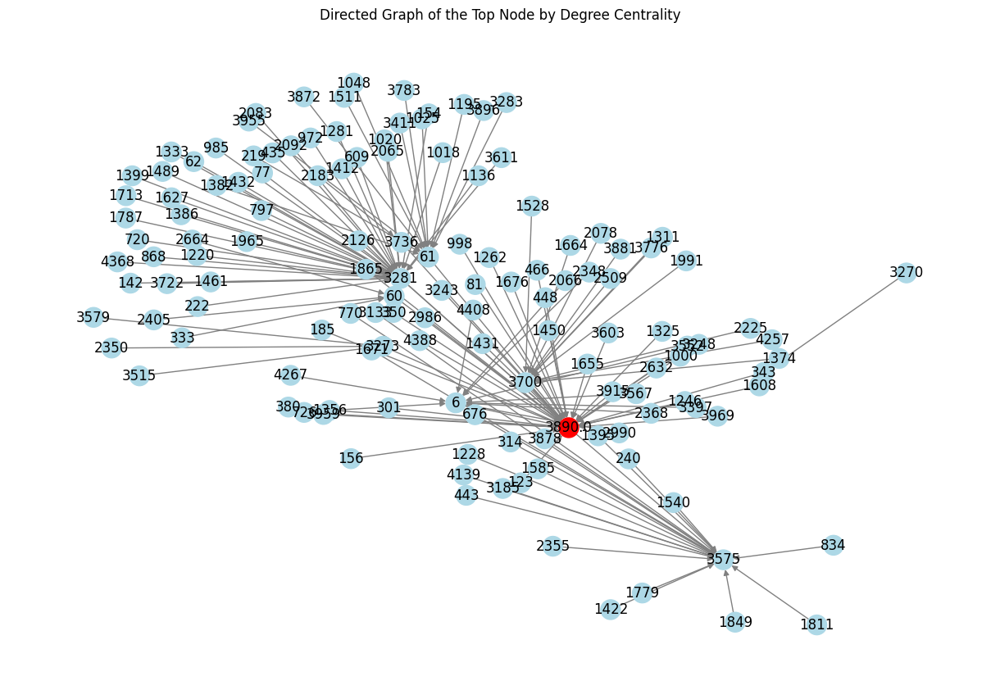

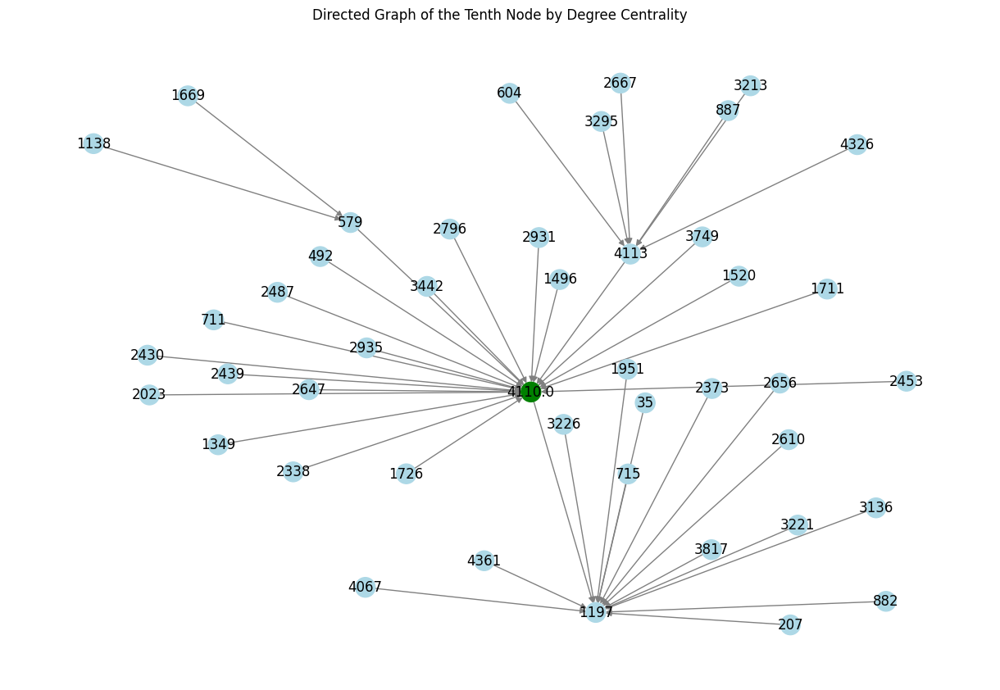

In [0]:
import networkx as nx
import pandas as pd
import matplotlib.pyplot as plt

# Print the number of nodes in the graph
print(f"Number of nodes: {G.number_of_nodes()}")

# Calculate degree centrality
degree_centrality = nx.degree_centrality(G)

# Convert degree centrality results to a Pandas DataFrame and sort
degree_centrality_df = pd.DataFrame(degree_centrality.items(), columns=['Node', 'Degree Centrality'])
degree_centrality_df = degree_centrality_df.sort_values(by='Degree Centrality', ascending=False)

# Get the top 10 nodes by degree centrality
top_10_degree_centrality = degree_centrality_df.head(10)

# Print the top 10 nodes by degree centrality and their number of edges
print("Top 10 nodes by Degree Centrality and their number of edges:")
for index, row in top_10_degree_centrality.iterrows():
    node = row['Node']
    person_id = G.nodes[node].get('attr_dict').get('Person ID')
    centrality = row['Degree Centrality']
    num_edges = G.degree(node)
    print(f"[Person ID = {person_id}]: Degree Centrality is {centrality}, Number of edges = {num_edges}")

# Draw the directed graph of the top node by degree centrality
top_node = top_10_degree_centrality.iloc[0]['Node']
neighbors = list(G.neighbors(top_node))
neighbors.append(top_node)
subgraph = G.subgraph(neighbors)

# Create a directed graph
directed_subgraph = nx.DiGraph()

# Add nodes and directed edges
for node in subgraph.nodes:
    directed_subgraph.add_node(node, **G.nodes[node])
    for neighbor in G.neighbors(node):
        if 'Supervisor ID' in G.nodes[neighbor]['attr_dict'] and G.nodes[neighbor]['attr_dict']['Supervisor ID'] == G.nodes[node]['attr_dict']['Person ID']:
            directed_subgraph.add_edge(neighbor, node)

# Draw the directed subgraph for the top node
plt.figure(figsize=(12, 8))
pos = nx.spring_layout(directed_subgraph)
node_colors = ['red' if node == top_node else 'lightblue' for node in directed_subgraph.nodes]
nx.draw(directed_subgraph, pos, with_labels=True, node_color=node_colors, edge_color='gray', arrows=True)
plt.title("Directed Graph of the Top Node by Degree Centrality")
plt.show()

# Draw the directed graph of the tenth node by degree centrality
tenth_node = top_10_degree_centrality.iloc[9]['Node']
neighbors = list(G.neighbors(tenth_node))
neighbors.append(tenth_node)
subgraph_tenth = G.subgraph(neighbors)

# Create a directed graph for the tenth node
directed_subgraph_tenth = nx.DiGraph()

# Add nodes and directed edges
for node in subgraph_tenth.nodes:
    directed_subgraph_tenth.add_node(node, **G.nodes[node])
    for neighbor in G.neighbors(node):
        if 'Supervisor ID' in G.nodes[neighbor]['attr_dict'] and G.nodes[neighbor]['attr_dict']['Supervisor ID'] == G.nodes[node]['attr_dict']['Person ID']:
            directed_subgraph_tenth.add_edge(neighbor, node)

# Draw the directed subgraph for the tenth node
plt.figure(figsize=(12, 8))
pos = nx.spring_layout(directed_subgraph_tenth)
node_colors = ['green' if node == tenth_node else 'lightblue' for node in directed_subgraph_tenth.nodes]
nx.draw(directed_subgraph_tenth, pos, with_labels=True, node_color=node_colors, edge_color='gray', arrows=True)
plt.title("Directed Graph of the Tenth Node by Degree Centrality")
plt.show()


Number of nodes: 4419
Top 10 nodes by Degree Centrality and their number of edges:
[Person ID = 62329]: Degree Centrality is 0.009053870529651425, Number of edges = 40
[Person ID = 23624]: Degree Centrality is 0.007922136713444997, Number of edges = 35
[Person ID = 48881]: Degree Centrality is 0.007922136713444997, Number of edges = 35
[Person ID = 110970]: Degree Centrality is 0.007243096423721141, Number of edges = 32
[Person ID = 96618]: Degree Centrality is 0.007016749660479855, Number of edges = 31
[Person ID = 23745]: Degree Centrality is 0.005658669081032141, Number of edges = 25
[Person ID = 111346]: Degree Centrality is 0.005658669081032141, Number of edges = 25
[Person ID = 123337]: Degree Centrality is 0.005432322317790856, Number of edges = 24
[Person ID = 60600]: Degree Centrality is 0.004979628791308284, Number of edges = 22
[Person ID = 85305]: Degree Centrality is 0.004979628791308284, Number of edges = 22


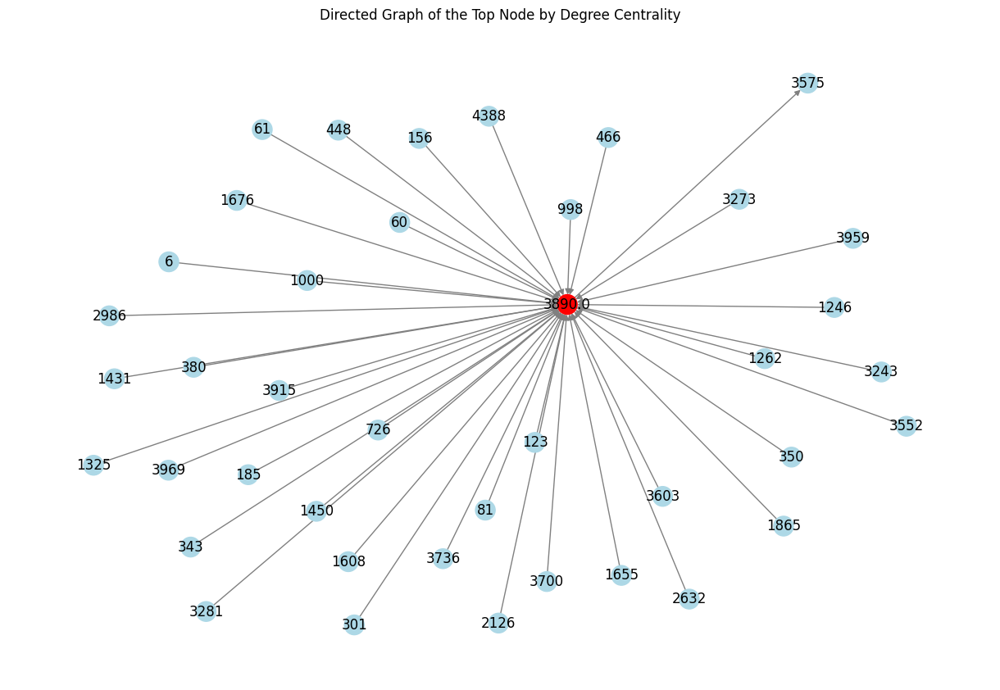

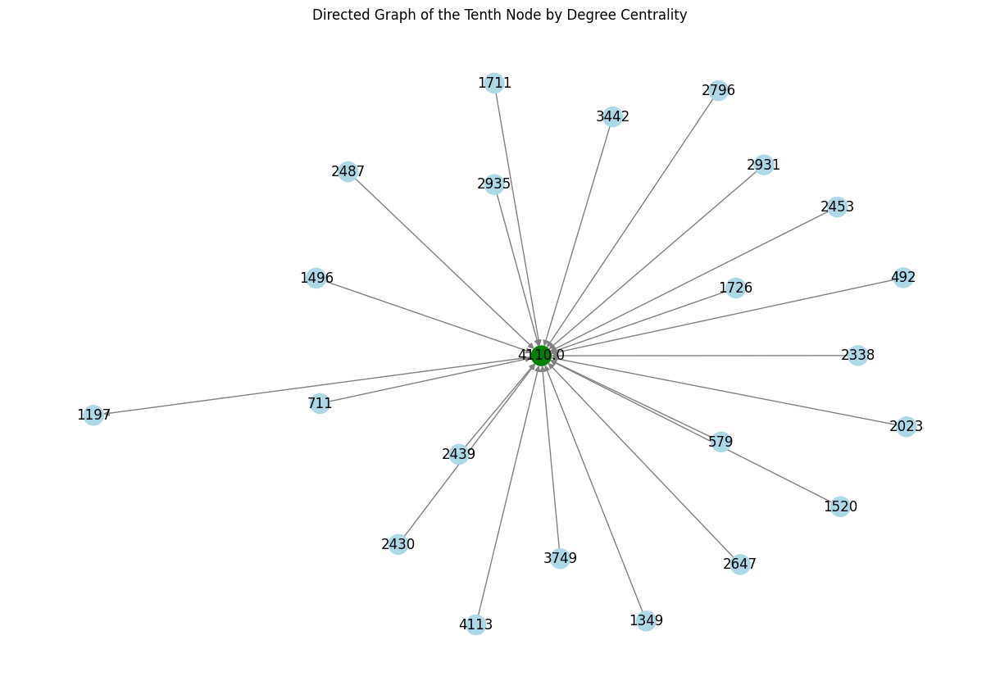

In [0]:
import networkx as nx
import pandas as pd
import matplotlib.pyplot as plt

# Print the number of nodes in the graph
print(f"Number of nodes: {G.number_of_nodes()}")

# Calculate degree centrality
degree_centrality = nx.degree_centrality(G)

# Convert degree centrality results to a Pandas DataFrame and sort
degree_centrality_df = pd.DataFrame(degree_centrality.items(), columns=['Node', 'Degree Centrality'])
degree_centrality_df = degree_centrality_df.sort_values(by='Degree Centrality', ascending=False)

# Get the top 10 nodes by degree centrality
top_10_degree_centrality = degree_centrality_df.head(10)

# Print the top 10 nodes by degree centrality and their number of edges
print("Top 10 nodes by Degree Centrality and their number of edges:")
for index, row in top_10_degree_centrality.iterrows():
    node = row['Node']
    person_id = G.nodes[node].get('attr_dict').get('Person ID')
    centrality = row['Degree Centrality']
    num_edges = G.degree(node)
    print(f"[Person ID = {person_id}]: Degree Centrality is {centrality}, Number of edges = {num_edges}")

# Draw the directed graph of the top node by degree centrality
top_node = top_10_degree_centrality.iloc[0]['Node']
neighbors = list(G.neighbors(top_node))
subgraph = G.subgraph([top_node] + neighbors)

# Create a directed graph
directed_subgraph = nx.DiGraph()

# Add nodes and directed edges
for node in subgraph.nodes:
    directed_subgraph.add_node(node, **G.nodes[node])
    if node == top_node:
        for neighbor in neighbors:
            if 'Supervisor ID' in G.nodes[neighbor]['attr_dict'] and G.nodes[neighbor]['attr_dict']['Supervisor ID'] == G.nodes[node]['attr_dict']['Person ID']:
                directed_subgraph.add_edge(neighbor, node)
            else:
                directed_subgraph.add_edge(node, neighbor)

# Draw the directed subgraph for the top node
plt.figure(figsize=(12, 8))
pos = nx.spring_layout(directed_subgraph)
node_colors = ['red' if node == top_node else 'lightblue' for node in directed_subgraph.nodes]
nx.draw(directed_subgraph, pos, with_labels=True, node_color=node_colors, edge_color='gray', arrows=True)
plt.title("Directed Graph of the Top Node by Degree Centrality")
plt.show()

# Draw the directed graph of the tenth node by degree centrality
tenth_node = top_10_degree_centrality.iloc[9]['Node']
neighbors = list(G.neighbors(tenth_node))
subgraph_tenth = G.subgraph([tenth_node] + neighbors)

# Create a directed graph for the tenth node
directed_subgraph_tenth = nx.DiGraph()

# Add nodes and directed edges
for node in subgraph_tenth.nodes:
    directed_subgraph_tenth.add_node(node, **G.nodes[node])
    if node == tenth_node:
        for neighbor in neighbors:
            if 'Supervisor ID' in G.nodes[neighbor]['attr_dict'] and G.nodes[neighbor]['attr_dict']['Supervisor ID'] == G.nodes[node]['attr_dict']['Person ID']:
                directed_subgraph_tenth.add_edge(neighbor, node)
            else:
                directed_subgraph_tenth.add_edge(node, neighbor)

# Draw the directed subgraph for the tenth node
plt.figure(figsize=(12, 8))
pos = nx.spring_layout(directed_subgraph_tenth)
node_colors = ['green' if node == tenth_node else 'lightblue' for node in directed_subgraph_tenth.nodes]
nx.draw(directed_subgraph_tenth, pos, with_labels=True, node_color=node_colors, edge_color='gray', arrows=True)
plt.title("Directed Graph of the Tenth Node by Degree Centrality")
plt.show()


In [0]:
closeness_centrality = nx.closeness_centrality(G)
betweenness_centrality = nx.betweenness_centrality(G)

# Convert to Pandas DataFrame for correlation analysis
centrality_df = pd.DataFrame({
    'Degree Centrality': list(degree_centrality.values()),
    'Closeness Centrality': list(closeness_centrality.values()),
    'Betweenness Centrality': list(betweenness_centrality.values())
})

# Calculate the correlation matrix
correlation_matrix = centrality_df.corr()
print(correlation_matrix)


---------------------------------------------------------------------------
NameError                                 Traceback (most recent call last)
File <command-1474724758608916>, line 1
----> 1 average_degree = sum(degrees) / len(degrees)
      2 print(f"Average Degree: {average_degree}")

NameError: name 'degrees' is not defined

In [0]:
combined_centrality_df = centrality_df.copy()
combined_centrality_df['Combined Score'] = (combined_centrality_df['Degree Centrality'] + 
                                            combined_centrality_df['Closeness Centrality'] + 
                                            combined_centrality_df['Betweenness Centrality']) / 3
combined_centrality_df = combined_centrality_df.sort_values(by='Combined Score', ascending=False)
print(combined_centrality_df.head(10))


---------------------------------------------------------------------------
NameError                                 Traceback (most recent call last)
File <command-1474724758608916>, line 1
----> 1 average_degree = sum(degrees) / len(degrees)
      2 print(f"Average Degree: {average_degree}")

NameError: name 'degrees' is not defined

# ABM

In [0]:
from pyspark.sql.functions import when, col

# Define the values to be replaced
values_to_replace = ['Customer & Corp Affairs', 'Chief Operations Office', 'Commercial', 'Executive Management', 'Finance & Group Services', 'HSE', 'ICT', 'People', 'Strategy', 'WA Region']

# Replace the values in the 'BU' column of the DataFrame
abm_df = result_df.withColumn('BU', 
                                 when(col('BU').isin(values_to_replace), 'Corporate')
                                 .otherwise(col('BU')))
display(abm_df)

## Sample Data

In [0]:
# Select the distinct values in the 'BU' column
bu_values = abm_df.select('BU').distinct().collect()
bu_values = [row['BU'] for row in bu_values]

example_data_list = []

# For each 'BU', select 10 rows from the DataFrame and append them to the list
for bu in bu_values:
    bu_sample = abm_df.filter(col('BU') == bu).limit(10)
    example_data_list.append(bu_sample)

# Initialize a new DataFrame with the sample data for the first 'BU'
example_data_spark = example_data_list[0]

for bu_sample in example_data_list[1:]:
    example_data_spark = example_data_spark.union(bu_sample)

display(example_data_spark)
example_data = example_data_spark.toPandas()

## Method 1: Mesa

In [0]:
pip install mesa

Note: you may need to restart the kernel using dbutils.library.restartPython() to use updated packages.
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 65.7/65.7 kB 1.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 15.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.4/78.4 kB 14.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 751.2/751.2 kB 26.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.4/66.4 kB 13.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 240.7/240.7 kB 29.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 36.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 130.2/130.2 kB 23.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.8/62.8 kB 11.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 72.0/72.0 kB 13.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 427.7/427.7 kB 40.7 MB/s eta 0:00:00
     ━━━━━

In [0]:
from pyspark.sql import SparkSession
from pyspark.sql.functions import col
import pandas as pd
import matplotlib.pyplot as plt
from mesa import Agent, Model
from mesa.time import RandomActivation
from mesa.space import MultiGrid
from mesa.datacollection import DataCollector

In [0]:
class EmployeeAgent(Agent):
    def __init__(self, model, data):
        """
        Initialize the EmployeeAgent.
        :param model: The model instance.
        :param data: A dictionary of employee data.
        """

        super().__init__(data['Person ID'], model)
        self.bu = data['BU']
        self.is_active = data['Employee Status'] == 'Active'
        # self.reporting_date = data['Reporting Date']
        # self.employee_status = data['Employee Status']
        # self.employee_class = data['Employee Class']
        # self.employment_type = data['Employment Type']
        # self.company = data['Company (Label)']
        # self.division = data['Division']
        # self.subdivision = data['Subdivision (Label)']
        # self.department = data['Department']
        # self.job_family = data['JH Job Family']
        # self.position_title = data['JH Position Title']
        # self.external_title = data['External Title']
        # self.start_date = data['Original Start Date']
        # self.hire_date = data['Hire Date']
        # self.last_day_of_service = data['Last Day of Service']
        # self.termination_reason = data['Sub Termination Reason (Label)']
        # self.location_group = data['Location Group (Name)']
        # self.city = data['RCM City']
        # self.state = data['RCM State (externalName)']
        # self.country = data['RCM Country (Picklist Label)']
        # self.gender = data['Gender']
        # self.age_group = data['Age (Group)']
        # self.proj_oh = data['Proj / OH']
        # self.placements = data['Placements']
        # self.tenure = data['Tenure (Group - Hire Date)']
        # self.manager_status = data['Manager/No Manager']
        # self.critical_core = data['Critical / Core']
        # self.generation = data['Generation']
        # self.diversity_question = data['Diversity Question']
        # self.job_level = data['Job Level']
        # self.pm_department = data['Department (PM)']

    def step(self):
        """
        Define the agent's behavior at each step of the simulation.
        
        ** Currently, the probability is set randomly and needs further analysis.
        """
        # Employees randomly change their BU with a 10% probability
        if self.random.random() < 0.1:
            self.bu = self.random.choice(self.model.bu_values)
        
        # Employees randomly leave with a 5% probability
        if self.random.random() < 0.05:
            self.is_active = False
            self.model.schedule.remove(self)
            self.model.grid.remove_agent(self)
        
    
class CompanyModel(Model):
    def __init__(self, employee_data, width, height):
        """
        Initialize the CompanyModel.
        :param employee_data: DataFrame containing employee data.
        :param width: Width of the grid.
        :param height: Height of the grid.
        """
        super().__init__()
        self.grid = MultiGrid(width, height, True)
        self.schedule = RandomActivation(self)
        # Ensure the model is running
        self.running = True 

        # Extract unique BU values from the data
        self.bu_values = employee_data['BU'].unique().tolist()
        self.employee_data = employee_data

        # Add initial employees to the model
        for i, row in employee_data.iterrows():
            self.add_employee(row)

        # Initialize DataCollector to track BU changes
        self.datacollector = DataCollector(
            agent_reporters={"BU": "bu"}
        )
    
    def add_employee(self, data):
        """
        Add an employee to the model.
        :param data: A dictionary of employee data.
        """
        employee = EmployeeAgent(self, data)
        self.schedule.add(employee)
        x = self.random.randrange(self.grid.width)
        y = self.random.randrange(self.grid.height)
        self.grid.place_agent(employee, (x, y))

    def step(self):
        """
        Advance the model by one step.
        """
        self.schedule.step()
        self.datacollector.collect(self)

        for agent in list(self.schedule.agents):
                if not agent.is_active:
                    self.schedule.remove(agent)
                    new_id = max(agent.unique_id for agent in self.schedule.agents) + 1
                    random_data = self.employee_data.sample().iloc[0]
                    self.add_employee(new_id, random_data)

In [0]:
# # Create and run the model instance
# model = CompanyModel(example_data, width=10, height=10)

# for i in range(10):
#     model.step()

# # Collect data
# data = model.datacollector.get_agent_vars_dataframe()
# data = data.reset_index()

# # Visualize the results
# bu_counts = data.groupby(['Step', 'BU']).size().unstack()
# bu_counts.plot(kind='bar', stacked=True)
# plt.xlabel('Step')
# plt.ylabel('Number of Employees')
# plt.title('Employee Distribution Across BUs Over Time')
# plt.show()

---------------------------------------------------------------------------
NameError                                 Traceback (most recent call last)
File <command-1474724758608916>, line 1
----> 1 average_degree = sum(degrees) / len(degrees)
      2 print(f"Average Degree: {average_degree}")

NameError: name 'degrees' is not defined

## Method 2: Mesa + Networkx

In [0]:
class EmployeeAgent(Agent):
    def __init__(self, unique_id, model, data):
        """
        Initialize the EmployeeAgent.
        :param unique_id: The unique identifier for the employee.
        :param model: The model instance.
        :param data: A dictionary of employee data.
        """
        super().__init__(data['Person ID'], model)
        self.bu = data['BU']
        self.is_active = data['Employee Status'] == 'Active'
        self.supervisor_id = data['Supervisor ID']

    def step(self):
        """
        Define the agent's behavior at each step of the simulation.
        """
        # Employees randomly change their BU with a 10% probability
        if self.random.random() < 0.1:
            self.bu = self.random.choice(self.model.bu_values)
        
        # Employees randomly leave with a 5% probability
        if self.random.random() < 0.05:
            self.is_active = False
            self.model.schedule.remove(self)
            self.model.graph.remove_node(self.unique_id)

class CompanyModel(Model):
    def __init__(self, employee_data):
        """
        Initialize the CompanyModel.
        :param employee_data: DataFrame containing employee data.
        """
        super().__init__()
        self.schedule = RandomActivation(self)
        self.running = True 

        # Initialize NetworkX graph for employee-manager relationships
        self.graph = nx.DiGraph()

        # Extract unique BU values from the data
        self.bu_values = employee_data['BU'].unique().tolist()
        self.employee_data = employee_data

        # Add initial employees to the model
        for i, row in employee_data.iterrows():
            self.add_employee(row)

        # Initialize DataCollector to track BU changes and steps
        self.datacollector = DataCollector(
            agent_reporters={"BU": "bu"},
            model_reporters={"BU_counts": self.count_bu}
        )
        self.step_counter = 0  # Initialize step counter
    
    def add_employee(self, data):
        """
        Add an employee to the model.
        :param data: A dictionary of employee data.
        """
        employee = EmployeeAgent(data['Person ID'], self, data)
        self.schedule.add(employee)

        # Add employee to NetworkX graph
        self.graph.add_node(employee.unique_id, bu=employee.bu)
        supervisor_id = data.get('Supervisor ID')
        if supervisor_id and supervisor_id in self.graph.nodes:
            self.graph.add_edge(supervisor_id, employee.unique_id)

    def step(self):
        """
        Advance the model by one step.
        """
        self.schedule.step()
        self.datacollector.collect(self)

        # Remove inactive employees and update the NetworkX graph
        for agent in list(self.schedule.agents):
            if not agent.is_active:
                self.schedule.remove(agent)
                self.graph.remove_node(agent.unique_id)
    
    def count_bu(self):
        bu_count = {bu: 0 for bu in self.bu_values}
        for agent in self.schedule.agents:
            if agent.is_active:
                bu_count[agent.bu] += 1
        return bu_count


In [0]:
def visualize_network(graph, step):
    """
    Visualize the NetworkX graph.
    :param graph: A NetworkX DiGraph instance representing the employee-manager relationships.
    :param step: The current step of the simulation.
    """
    plt.figure(figsize=(10, 7))
    pos = nx.spring_layout(graph)  # Compute the layout for visualizing
    nx.draw(graph, pos, with_labels=True, node_color='lightblue', node_size=2000, font_size=10, font_weight='bold', edge_color='gray', arrows=True)
    plt.title(f'Network - Step {step}')
    plt.show()
    # time.sleep(1)  # Add delay to visualize changes step-by-step

# Create and run the model instance
model = CompanyModel(employee_data=example_data)

# Run the model for 10 steps and visualize at each step
for i in range(10):
    model.step()
    visualize_network(model.graph, i)

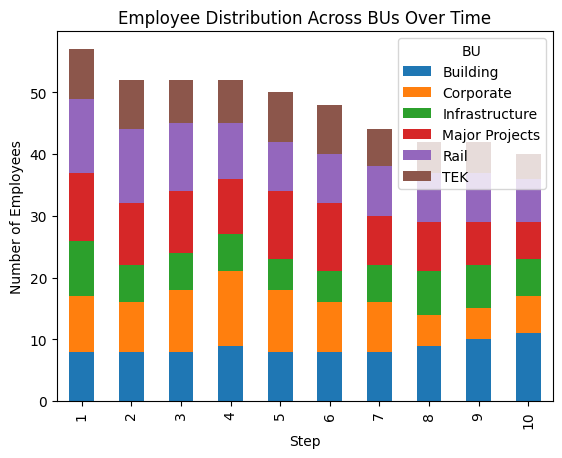

In [0]:

# Create and run the model instance
model = CompanyModel(example_data)

for i in range(10):
    model.step()

# Collect data
data = model.datacollector.get_agent_vars_dataframe()
data = data.reset_index()

# Visualize the results
bu_counts = data.groupby(['Step', 'BU']).size().unstack()
bu_counts.plot(kind='bar', stacked=True)
plt.xlabel('Step')
plt.ylabel('Number of Employees')
plt.title('Employee Distribution Across BUs Over Time')
plt.show()